## 4. Evaluation Metrics for Classification

In the previous session we trained a model for predicting churn. How do we know if it's good?

### 4.1 Evaluation metrics: session overview

- Dataset:https://www.kaggle.com/datasets/blastchar/telco-customer-churn

Metric - function that compares the predictions with the actual values and outputs a single number that tells how good the predictions are

In [62]:
import pandas as pd
import numpy as np


import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction import DictVectorizer
from sklearn.linear_model import LogisticRegression

In [3]:
df = pd.read_csv('/home/timur/work_hub/ml_zoomcamp2023/3. Machine Learning for Classification/WA_Fn-UseC_-Telco-Customer-Churn.csv')

df.columns = df.columns.str.lower().str.replace(' ', '_')

categorical_columns = list(df.dtypes[df.dtypes == 'object'].index)

for c in categorical_columns:
    df[c] = df[c].str.lower().str.replace(' ', '_')
    
    
df.totalcharges = pd.to_numeric(df.totalcharges, errors='coerce')
df.totalcharges = df.totalcharges.fillna(0)


df.churn = (df.churn == 'yes').astype(int)

In [4]:
df_full_train, df_test = train_test_split(df, test_size=0.2, random_state=1)
df_train, df_val = train_test_split(df_full_train, test_size=0.25, random_state=1)

df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

y_train = df_train.churn.values
y_val = df_val.churn.values
y_test = df_test.churn.values


del df_train['churn']
del df_val['churn']
del df_test['churn']

In [5]:
numerical = ['tenure', 'monthlycharges', 'totalcharges']

categorical = ['gender', 'seniorcitizen', 'partner', 'dependents',
               'phoneservice', 'multiplelines', 'internetservice',
               'onlinesecurity', 'onlinebackup', 'deviceprotection', 'techsupport',
               'streamingtv', 'streamingmovies', 'contract', 'paperlessbilling',
               'paymentmethod']

In [6]:
dv = DictVectorizer(sparse=False)

train_dict = df_train[categorical + numerical].to_dict(orient='records')
X_train = dv.fit_transform(train_dict)

model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

In [7]:
val_dict = df_val[categorical + numerical].to_dict(orient='records')
X_val = dv.transform(val_dict)


y_pred = model.predict_proba(X_val)[:,1]
churn_decision = (y_pred >= 0.5)
(y_val == churn_decision).mean()

0.8034066713981547

### 4.2 Accuracy and dummy model

- Evaluate the model on different thersholds
- Check the accuracy of dummy baselines

In [8]:
from sklearn.metrics import accuracy_score

In [9]:
thresholds = np.linspace(0, 1, 21)

scores = []

for t in thresholds:
    score = accuracy_score(y_val, y_pred >= t)
    print('%.2f %.3f' % (t, score))
    scores.append(score)

0.00 0.274
0.05 0.509
0.10 0.591
0.15 0.666
0.20 0.710
0.25 0.739
0.30 0.760
0.35 0.772
0.40 0.785
0.45 0.793
0.50 0.803
0.55 0.801
0.60 0.795
0.65 0.786
0.70 0.766
0.75 0.744
0.80 0.735
0.85 0.726
0.90 0.726
0.95 0.726
1.00 0.726


In [10]:
scores

[0.2739531582682754,
 0.5088715400993612,
 0.5911994322214337,
 0.6664300922640171,
 0.7097232079489,
 0.7388218594748048,
 0.7601135557132718,
 0.7721788502484032,
 0.7849538679914834,
 0.7934705464868701,
 0.8034066713981547,
 0.801277501774308,
 0.794889992902768,
 0.7863733144073811,
 0.765791341376863,
 0.7444996451383961,
 0.7345635202271115,
 0.7260468417317246,
 0.7260468417317246,
 0.7260468417317246,
 0.7260468417317246]

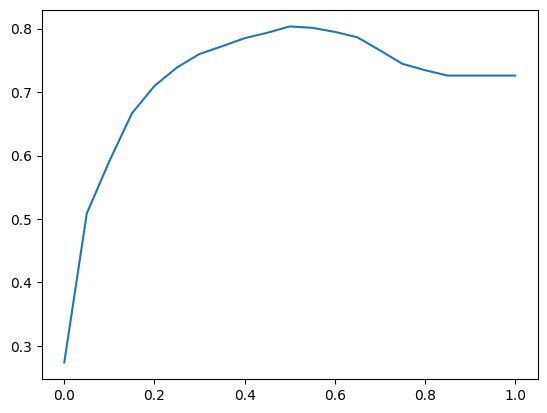

In [11]:
plt.plot(thresholds, scores)

So we checked different churn decision score and indeed score >0.5 gave us the best result

But we also have a problem here. Let's look on our the first and the last decision score 

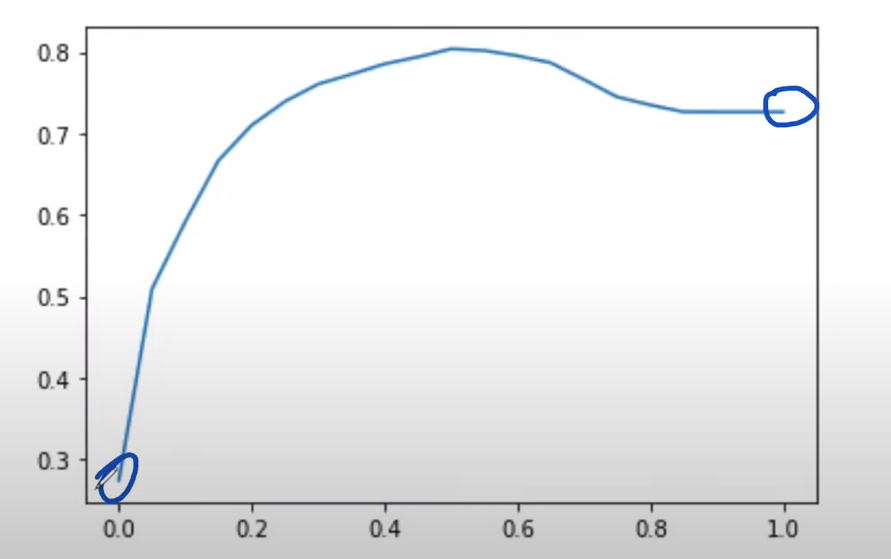

If we take churn decision score = 1.0 it means in our model that we say what our cusomers are churning if the score will be > 1. It's technically means what all customers aren't churning because we don't have values > 1

In [12]:
from collections import Counter

In [13]:
Counter(y_pred >= 1)

Counter({False: 1409})

#### In other words our model 'tells' us (wrongly): 'Ok, relax, there aren't any problems, nobody going to churn'

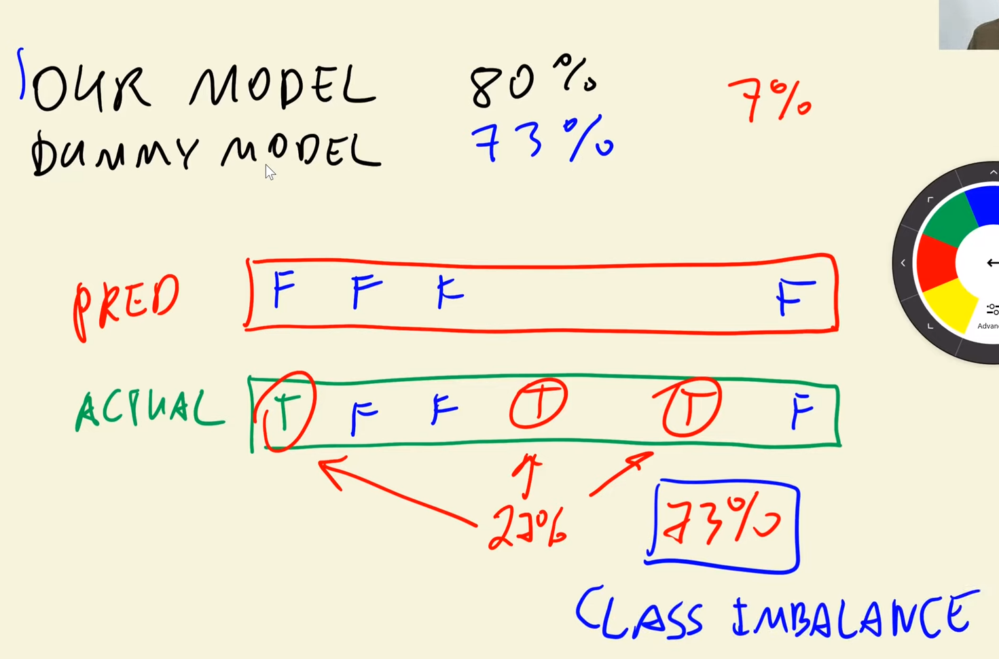

That's the problem with accuracy when we have class imbalance (how in our case). We see that only 27% of our users are going to churnig 

In [14]:
y_val.mean()

0.2739531582682754

### 4.3 Confusion table

- Different types of errors and correct decisions
- Arranging them in table

In [15]:
actual_positive = (y_val == 1)
actual_negative = (y_val == 0)

In [16]:
actual_positive

array([False, False, False, ..., False,  True,  True])

In [17]:
t = 0.5

predict_positive = (y_pred >= t)
predict_negative = (y_pred < t)

In [18]:
predict_positive

array([False, False, False, ..., False,  True,  True])

In [19]:
tp = (predict_positive & actual_positive).sum()
tp

210

In [20]:
tn = (predict_negative & actual_negative).sum()
tn

922

In [21]:
fp = (predict_positive & actual_negative).sum()
fn = (predict_negative & actual_positive).sum()

In [22]:
fp, fn

(101, 176)

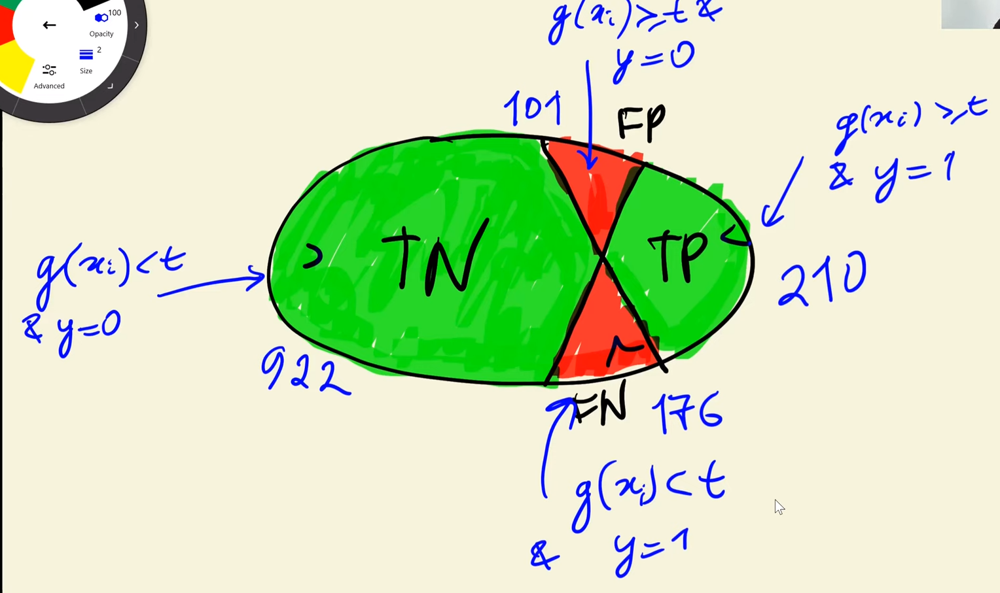

Confusion table 

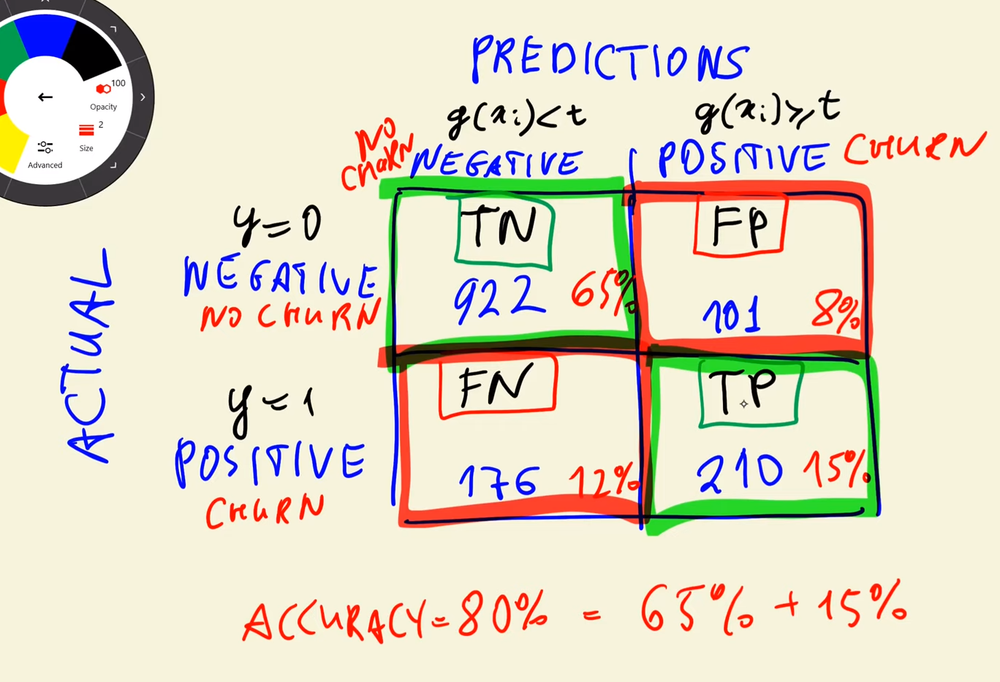

Let's implement it in NumPy

In [23]:
confusion_matrix = np.array([
    [tn, fp],
    [fn, tp]
])

confusion_matrix

array([[922, 101],
       [176, 210]])

In [24]:
(confusion_matrix / confusion_matrix.sum()).round(2)

array([[0.65, 0.07],
       [0.12, 0.15]])

## 4.4 Precision and Recall

Our accuracy

In [25]:
(tp + tn) / (tp + tn + fp + fn)

0.8034066713981547

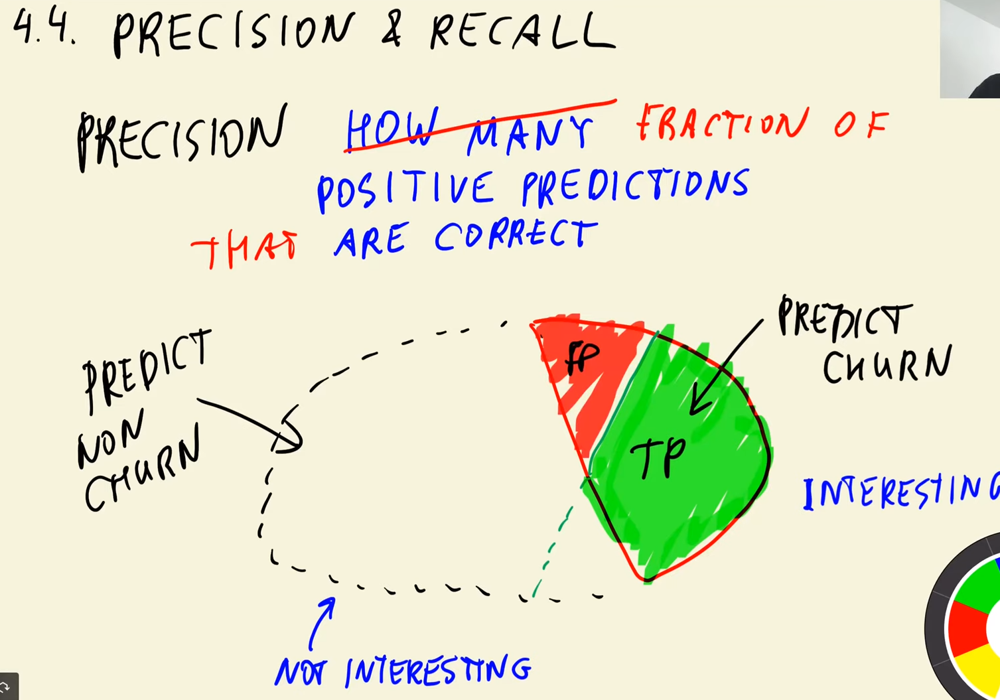

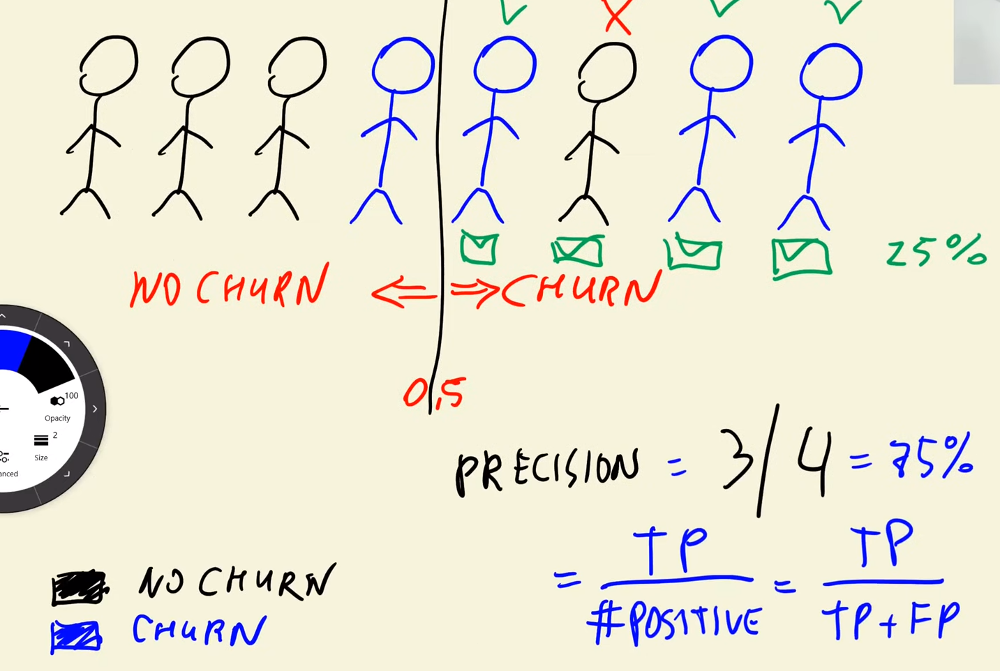

Let's implement this

In [26]:
precision = tp / (tp + fp)
precision

0.6752411575562701

In [27]:
tp

210

In [28]:
tp + fp

311

So **precision** can tell us that we think that 311 customers are going to churn and have to sent them promotion in order to hold them with our company. But in reallity only 210 customers (or 67%) of our prediction will actually churn.

Recall

 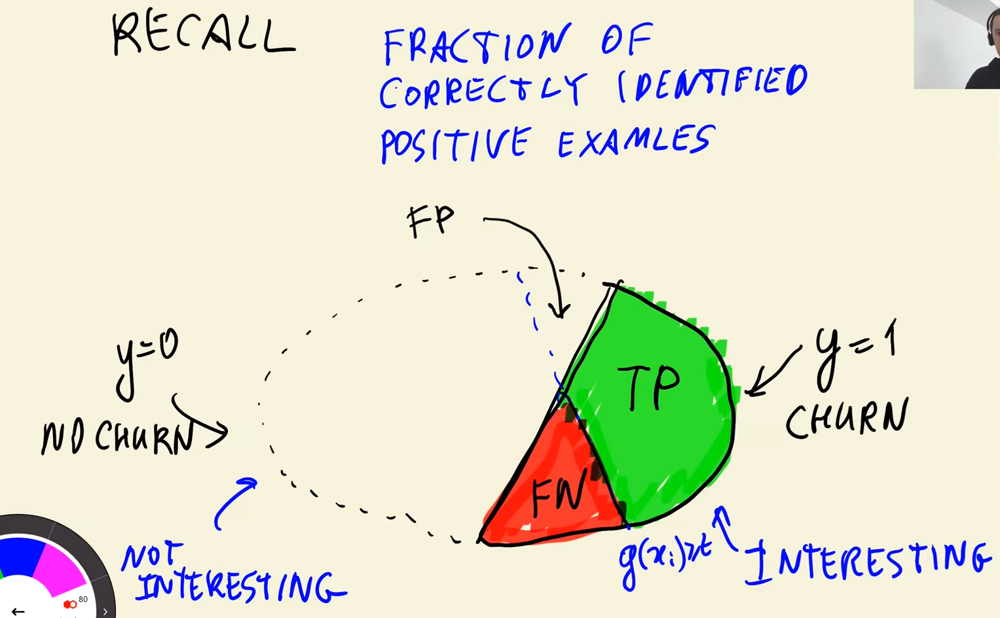

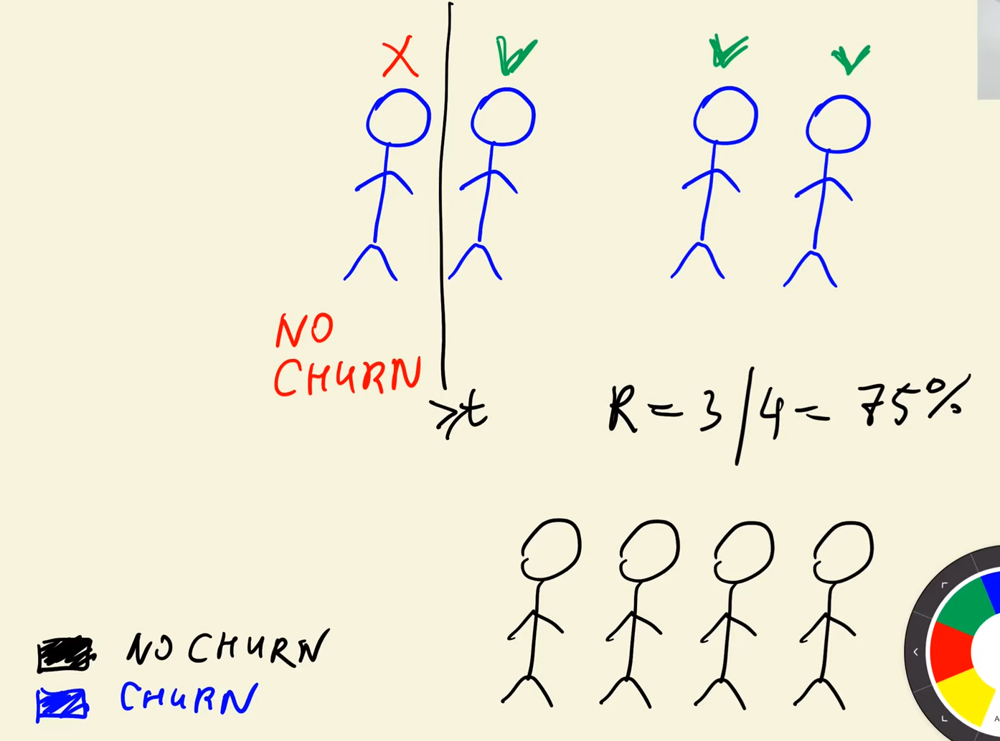

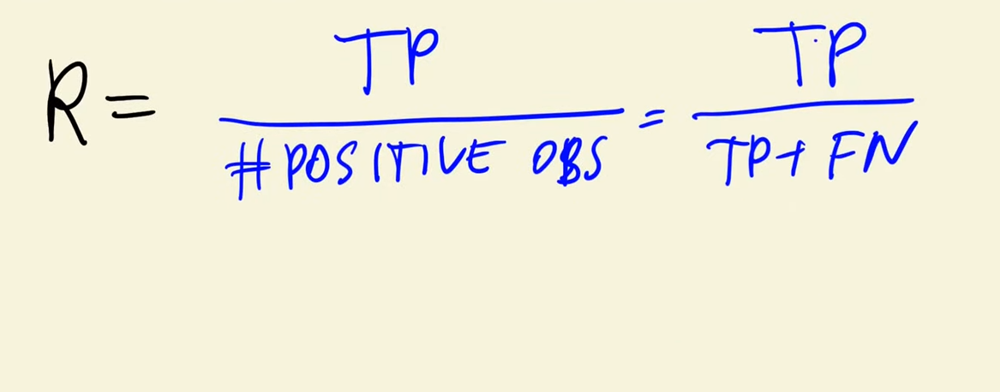

Let's implement this

In [29]:
recall = tp / (tp + fn)
recall

0.5440414507772021

So recall shows us that we failed to identify 46% of our potential churn client

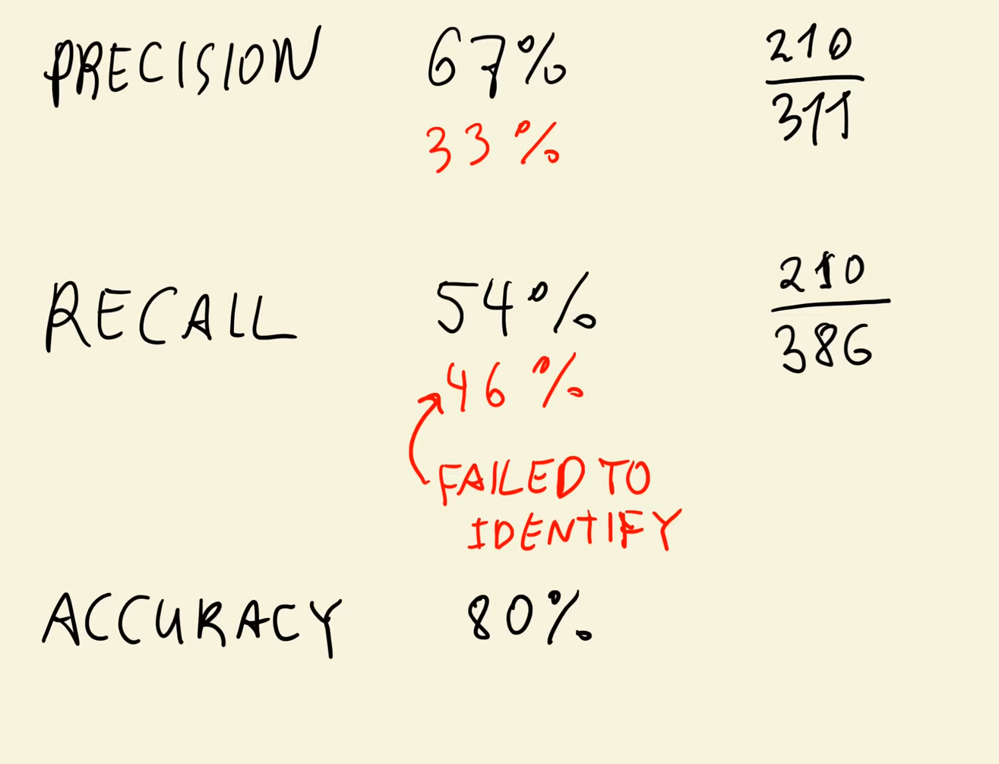

What picture above shows exactly. At first we get our accuracy score and thought that our model pretty correct, because 80% accuracy looks like a good quality, right? 

Actually not. If we look at **precision and recall metrics** we see that 33% of our promotion which were send to our potential churn customers wasn't necessary (**precision**) and 46% of potential churn customets we didn't identify (**recall**). From that point of your quality of our model doesn't look good.


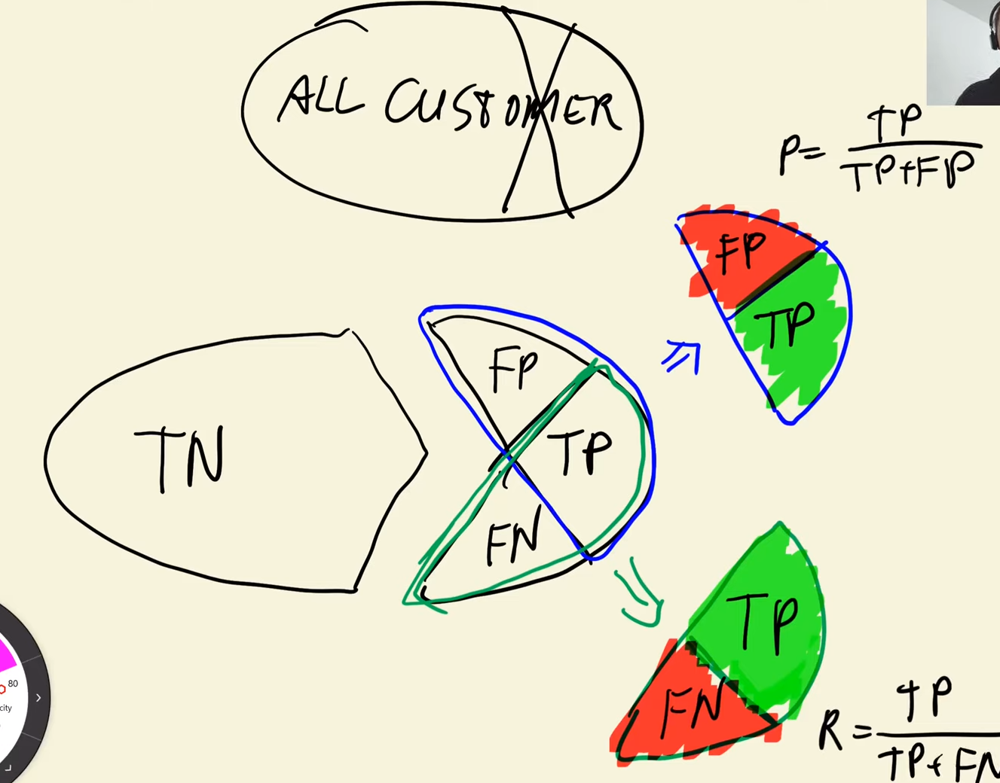

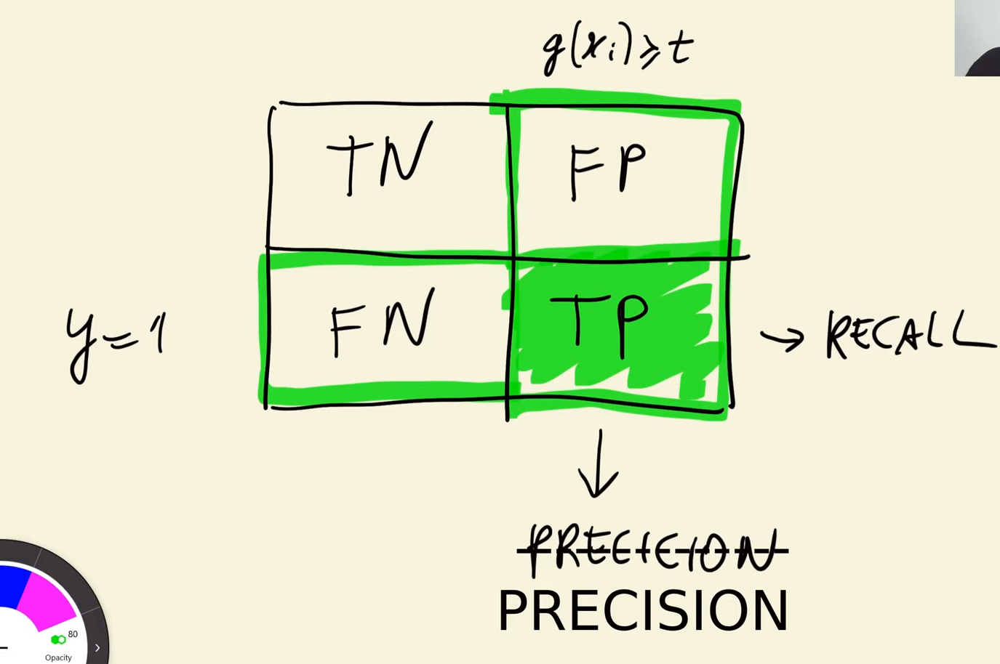

## 4.5 ROC Curves

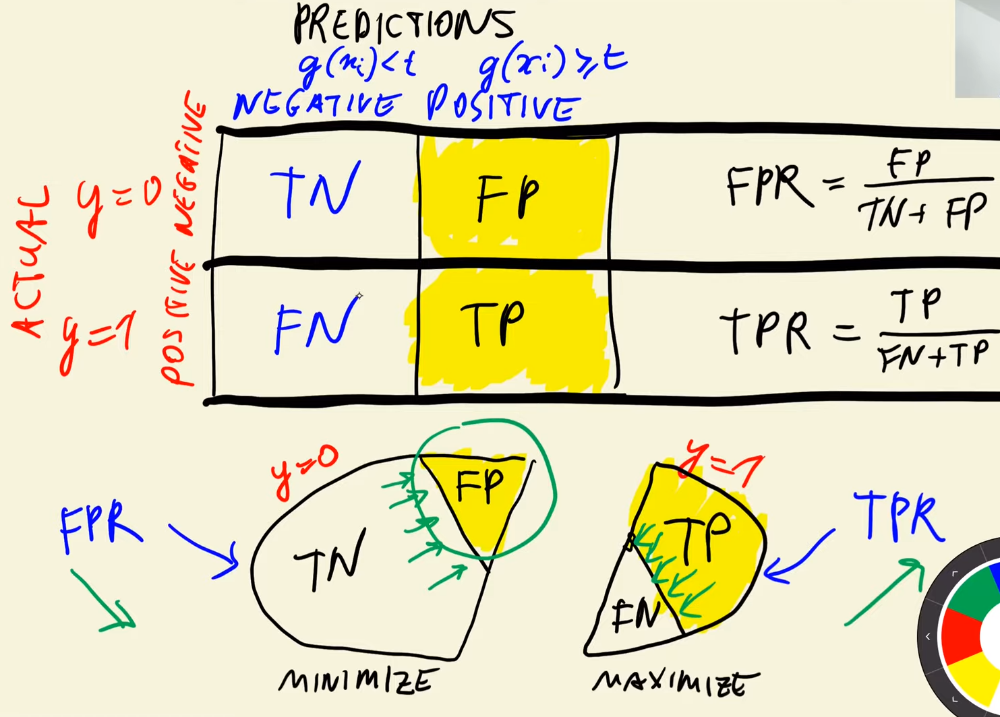

true positive rate

In [30]:
tpr = tp / (tp + fn)
tpr

0.5440414507772021

false positive rate

In [31]:
fpr = fp / (fp + tn)
fpr

0.09872922776148582

In [32]:
scores = []


thresholds = np.linspace(0, 1, 101)

for t in thresholds:
    actual_positive = (y_val == 1)
    actual_negative = (y_val == 0)
    
    predict_positive = (y_pred >= t)
    predict_negative = (y_pred < t)
    
    tp = (predict_positive & actual_positive).sum()
    tn = (predict_negative & actual_negative).sum()

    fp = (predict_positive & actual_negative).sum()
    fn = (predict_negative & actual_positive).sum()
    
    
    scores.append((t, tp, fp, fn, tn))

Evaluation different confusions matrix with different threshols from 0 to 1

In [33]:
scores

[(0.0, 386, 1023, 0, 0),
 (0.01, 385, 913, 1, 110),
 (0.02, 384, 830, 2, 193),
 (0.03, 383, 766, 3, 257),
 (0.04, 381, 715, 5, 308),
 (0.05, 379, 685, 7, 338),
 (0.06, 377, 661, 9, 362),
 (0.07, 372, 641, 14, 382),
 (0.08, 371, 613, 15, 410),
 (0.09, 369, 580, 17, 443),
 (0.1, 366, 556, 20, 467),
 (0.11, 365, 528, 21, 495),
 (0.12, 365, 509, 21, 514),
 (0.13, 360, 477, 26, 546),
 (0.14, 355, 453, 31, 570),
 (0.15, 351, 435, 35, 588),
 (0.16, 347, 419, 39, 604),
 (0.17, 346, 401, 40, 622),
 (0.18, 344, 384, 42, 639),
 (0.19, 338, 369, 48, 654),
 (0.2, 333, 356, 53, 667),
 (0.21, 330, 341, 56, 682),
 (0.22, 323, 322, 63, 701),
 (0.23, 320, 313, 66, 710),
 (0.24, 316, 304, 70, 719),
 (0.25, 309, 291, 77, 732),
 (0.26, 304, 281, 82, 742),
 (0.27, 303, 270, 83, 753),
 (0.28, 295, 256, 91, 767),
 (0.29, 291, 244, 95, 779),
 (0.3, 284, 236, 102, 787),
 (0.31, 280, 230, 106, 793),
 (0.32, 278, 226, 108, 797),
 (0.33, 276, 221, 110, 802),
 (0.34, 274, 212, 112, 811),
 (0.35000000000000003, 272,

In [34]:
columns = ['threshold', 'tp', 'fp', 'fn', 'tn']
df = pd.DataFrame(scores, columns=columns)

In [35]:
df

,threshold,tp,fp,fn,tn
0,0.00,386,1023,0,0
1,0.01,385,913,1,110
2,0.02,384,830,2,193
3,0.03,383,766,3,257
4,0.04,381,715,5,308
...,...,...,...,...,...
96,0.96,0,0,386,1023
97,0.97,0,0,386,1023
98,0.98,0,0,386,1023
99,0.99,0,0,386,1023


Let's look at each 10 record

In [36]:
df[::10]

,threshold,tp,fp,fn,tn
0,0.0,386,1023,0,0
10,0.1,366,556,20,467
20,0.2,333,356,53,667
30,0.3,284,236,102,787
40,0.4,249,166,137,857
50,0.5,210,101,176,922
60,0.6,150,53,236,970
70,0.7,76,20,310,1003
80,0.8,13,1,373,1022
90,0.9,0,0,386,1023


Let's computre true positive rate and false positive rate

In [37]:
df['tpr'] = df.tp / (df.tp + df.fn)
df['fpr'] = df.fp / (df.fp + df.tn)

In [38]:
df[::10]

,threshold,tp,fp,fn,tn,tpr,fpr
0,0.0,386,1023,0,0,1.000000,1.000000
10,0.1,366,556,20,467,0.948187,0.543500
20,0.2,333,356,53,667,0.862694,0.347996
30,0.3,284,236,102,787,0.735751,0.230694
40,0.4,249,166,137,857,0.645078,0.162268
50,0.5,210,101,176,922,0.544041,0.098729
60,0.6,150,53,236,970,0.388601,0.051808
70,0.7,76,20,310,1003,0.196891,0.019550
80,0.8,13,1,373,1022,0.033679,0.000978
90,0.9,0,0,386,1023,0.000000,0.000000


Let's plot them

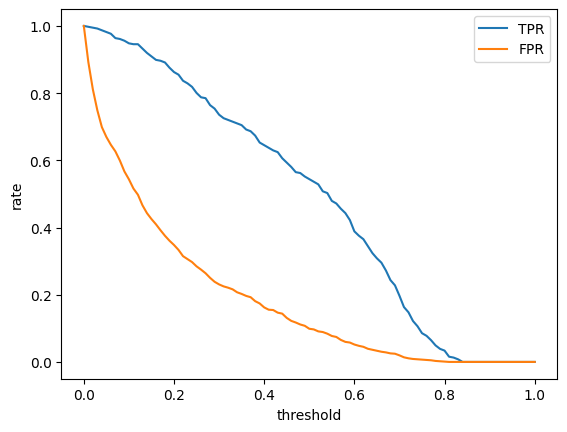

In [57]:
plt.plot(df.threshold, df['tpr'], label='TPR')
plt.plot(df.threshold, df['fpr'], label='FPR')

plt.xlabel('threshold')
plt.ylabel('rate')


plt.legend()

So we see how our TPR and FPR distributed. In general we want to minimize FPR and maximaze TPR

#### Random model

At the previous step we compare our actual df_val and df_pred. Not let's try to do the same, but instead of df_pred we create random predictions using np.random.uniform

np.random.uniform used to generate random numbers with uniform distribution.

In [40]:
np.random.seed(1)
y_rand = np.random.uniform(0, 1, size=len(y_val))

<Axes: ylabel='Count'>

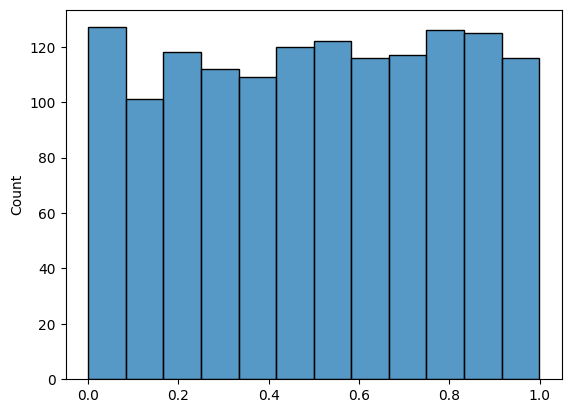

In [63]:
sns.histplot(y_rand)

In [64]:
y_rand.round(3)

array([0.417, 0.72 , 0.   , ..., 0.774, 0.334, 0.089])

In [65]:
((y_rand >= 0.5) == y_val).mean()

0.5017743080198722

Create dataframe with TPR and FPR for our random predictions

In [43]:
def tpr_fpr_dataframe(y_val, y_pred):
    scores = []
    thresholds = np.linspace(0, 1, 101)

    for t in thresholds:
        actual_positive = (y_val == 1)
        actual_negative = (y_val == 0)

        predict_positive = (y_pred >= t)
        predict_negative = (y_pred < t)

        tp = (predict_positive & actual_positive).sum()
        tn = (predict_negative & actual_negative).sum()

        fp = (predict_positive & actual_negative).sum()
        fn = (predict_negative & actual_positive).sum()


        scores.append((t, tp, fp, fn, tn))    
        
    columns = ['threshold', 'tp', 'fp', 'fn', 'tn']
    df = pd.DataFrame(scores, columns=columns)
    
    df['tpr'] = df.tp / (df.tp + df.fn)
    df['fpr'] = df.fp / (df.fp + df.tn)
    
    return df

In [66]:
df_rand = tpr_fpr_dataframe(y_val, y_rand)

In [67]:
df_rand[::10]

,threshold,tp,fp,fn,tn,tpr,fpr
0,0.0,386,1023,0,0,1.000000,1.000000
10,0.1,347,923,39,100,0.898964,0.902248
20,0.2,307,822,79,201,0.795337,0.803519
30,0.3,276,724,110,299,0.715026,0.707722
40,0.4,237,624,149,399,0.613990,0.609971
50,0.5,202,518,184,505,0.523316,0.506354
60,0.6,161,409,225,614,0.417098,0.399804
70,0.7,121,302,265,721,0.313472,0.295210
80,0.8,78,206,308,817,0.202073,0.201369
90,0.9,40,101,346,922,0.103627,0.098729


Let's plot it

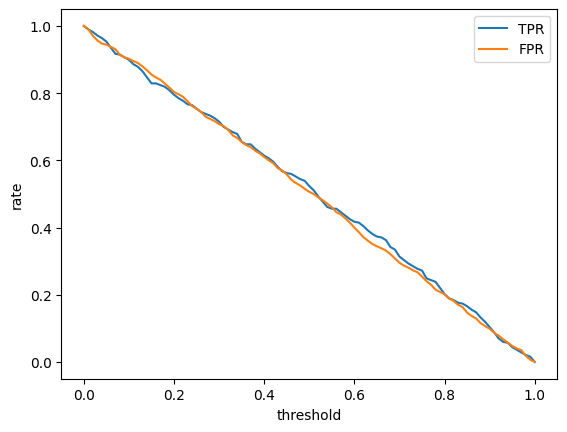

In [69]:
plt.plot(df_rand.threshold, df_rand['tpr'], label='TPR')
plt.plot(df_rand.threshold, df_rand['fpr'], label='FPR')

plt.xlabel('threshold')
plt.ylabel('rate')

plt.legend()

We see that for random predicitons with uniform distribution TPR and FPR almost the same

Ideal model

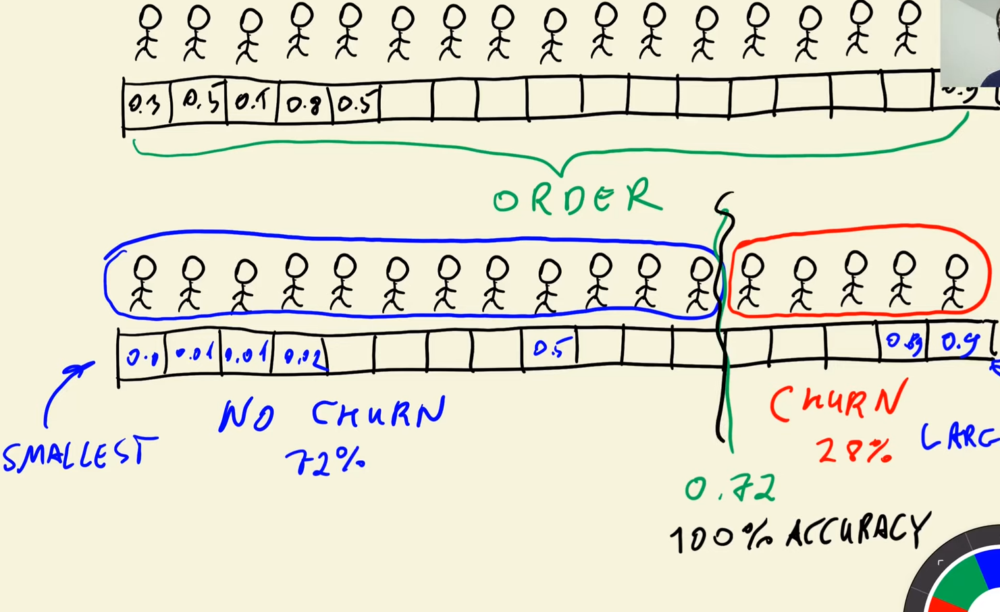

In [70]:
num_neg = (y_val == 0).sum()
num_pos = (y_val == 1).sum()

num_neg, num_pos

(1023, 386)

In [71]:
y_idel = np.repeat([0, 1], [num_neg, num_pos])
y_idel

array([0, 0, 0, ..., 1, 1, 1])

In [72]:
y_ideal_pred = np.linspace(0, 1, len(y_val))

In [73]:
((y_ideal_pred >= 0.726) == y_idel).mean()

1.0

In [74]:
df_ideal = tpr_fpr_dataframe(y_idel, y_ideal_pred)

In [75]:
df_ideal[::10]

,threshold,tp,fp,fn,tn,tpr,fpr
0,0.0,386,1023,0,0,1.000000,1.000000
10,0.1,386,882,0,141,1.000000,0.862170
20,0.2,386,741,0,282,1.000000,0.724340
30,0.3,386,600,0,423,1.000000,0.586510
40,0.4,386,459,0,564,1.000000,0.448680
50,0.5,386,319,0,704,1.000000,0.311828
60,0.6,386,178,0,845,1.000000,0.173998
70,0.7,386,37,0,986,1.000000,0.036168
80,0.8,282,0,104,1023,0.730570,0.000000
90,0.9,141,0,245,1023,0.365285,0.000000


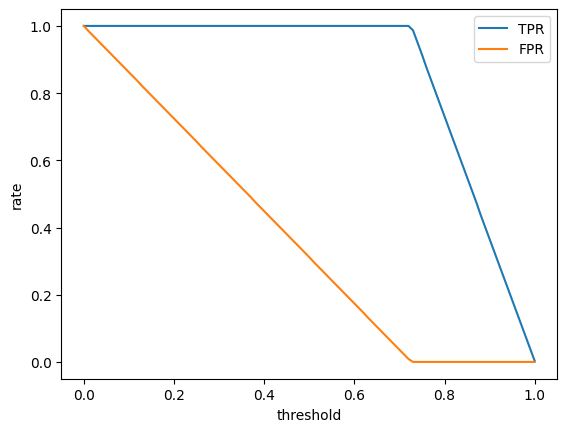

In [76]:
plt.plot(df_ideal.threshold, df_ideal['tpr'], label='TPR')
plt.plot(df_ideal.threshold, df_ideal['fpr'], label='FPR')


plt.xlabel('threshold')
plt.ylabel('rate')


plt.legend()

## Putting everything together

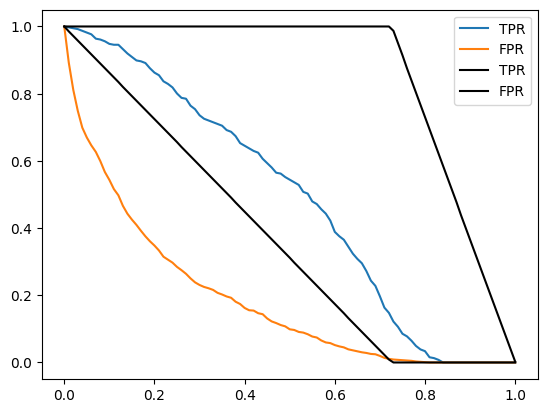

In [54]:
plt.plot(df.threshold, df['tpr'], label='TPR')
plt.plot(df.threshold, df['fpr'], label='FPR')

# plt.plot(df_rand.threshold, df_rand['tpr'], label='TPR')
# plt.plot(df_rand.threshold, df_rand['fpr'], label='FPR')

plt.plot(df_ideal.threshold, df_ideal['tpr'], label='TPR', color='black')
plt.plot(df_ideal.threshold, df_ideal['fpr'], label='FPR', color='black')

plt.legend()

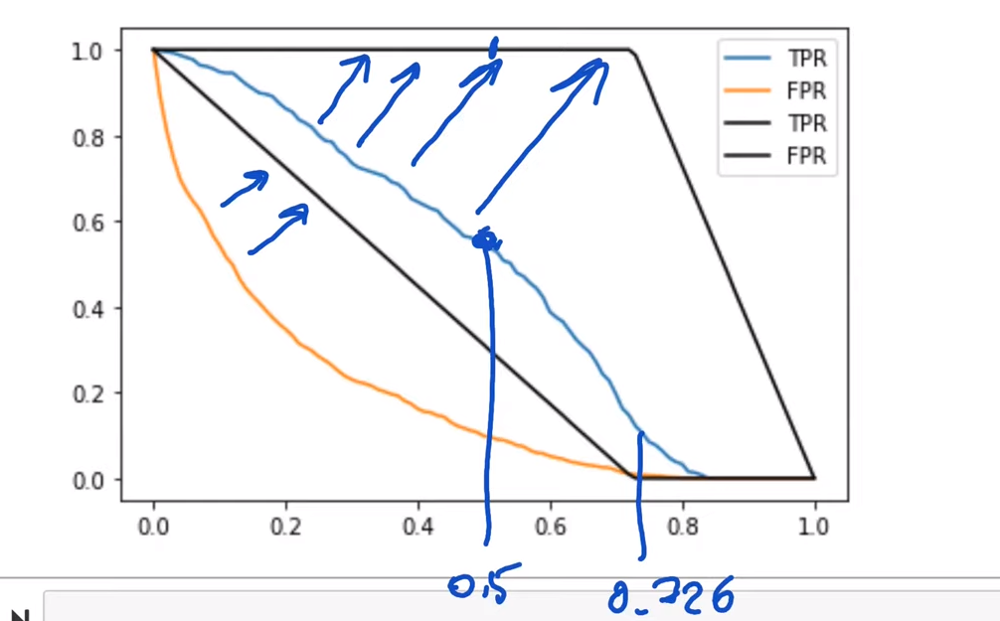

In the picture above we see how TPR and FPR distributed in ideal model with threshold = 0.726 (black line) and  how TPR and FPR distributed in our model. Like I said early we want to minimize FRP and maximaze TPR. In the picture above this is shown by arrows that tend to the ideal distribution.

Let's visualize TPR/FPR distributuin on one picture

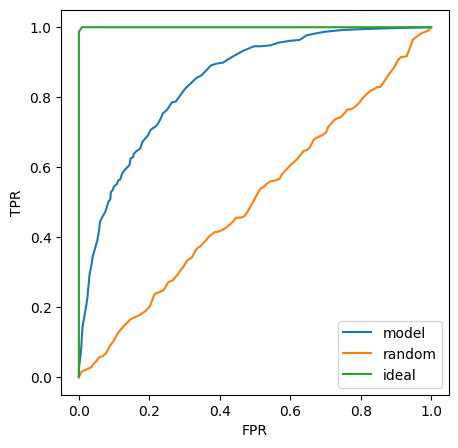

In [55]:
plt.figure(figsize=(5,5))

plt.plot(df.fpr, df.tpr, label='model')
plt.plot(df_rand.fpr, df_rand.tpr, label='random')
plt.plot(df_ideal.fpr, df_ideal.tpr, label='ideal')

plt.xlabel('FPR')
plt.ylabel('TPR')

plt.legend()

We want to find our idel spot (north star). This point - the point where TPR is 100% and FPR is 0%.

Our ideal spot

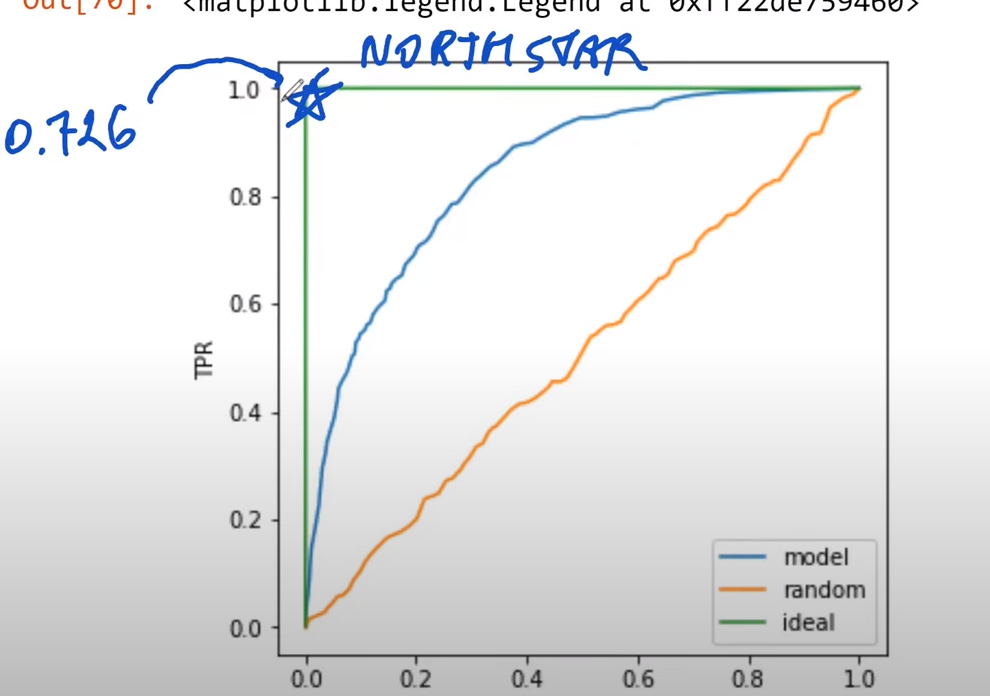

This is how ROC curve looks like - to plot TRP against FPR

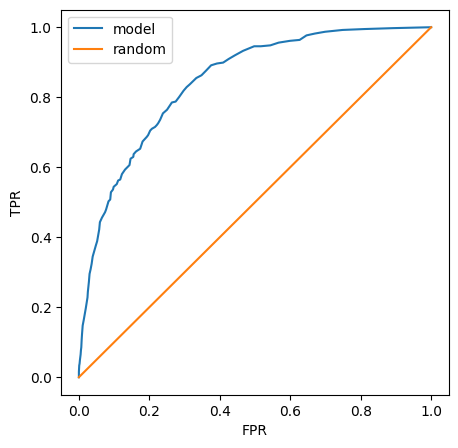

In [56]:
plt.figure(figsize=(5,5))

plt.plot(df.fpr, df.tpr, label='model')
plt.plot([0, 1], [0, 1], label='random')
# plt.plot(df_rand.fpr, df_rand.tpr, label='random')
# plt.plot(df_ideal.fpr, df_ideal.tpr, label='ideal')

plt.xlabel('FPR')
plt.ylabel('TPR')

plt.legend()

Let's try to understand what kind of information we can get from this plot

The first is threshold = 1

- the first point is where TPR = FPR = 0. 
- In this scenario we don't have churn prediction or our model shows that nobody is churning and hence TPR = 0
- At the same time FPR = 0 because all our predictions are True negative, there aren't False negative cases 


We get opposite situation when threshold is = 0. In the picture is the place where TPR = FPR = 1

When we start decrease or threshold (0.7 - 0.6 - 0.5) our TPR increse (because our model start to identify churn cases) and at the same time FRP decrese (because or model start to do mistake as well) 

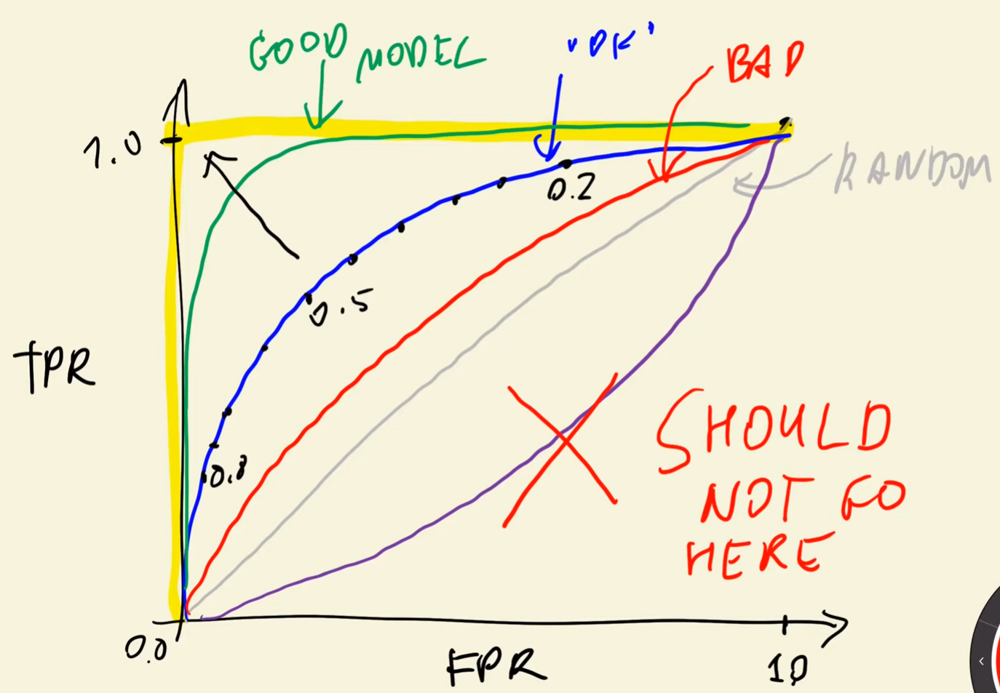

There're several ROC Curves. And every point on thin curves are particular thresholds. So we evaluate our model with different thresholds and then we try to see how close our curve to idel curve (yellow curve on the picture) 

We create our ROC curve by our own previously. But actually we can use scikit-learn for this 

In [78]:
from sklearn.metrics import roc_curve

The outpur roc_curve are FPR, TPR and thresholds

In [82]:
fpr, tpr, threshols = roc_curve(y_val, y_pred)

Let's plot it

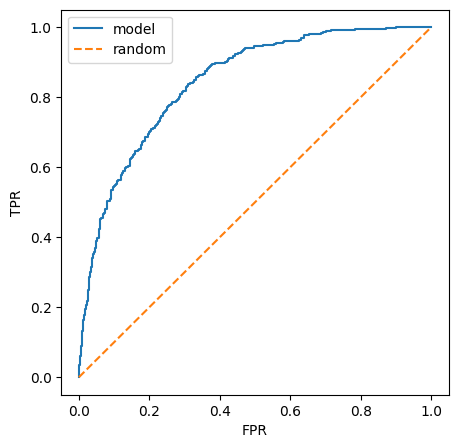

In [84]:
plt.figure(figsize=(5,5))

plt.plot(fpr, tpr, label='model')
plt.plot([0, 1], [0, 1], label='random', linestyle='--')
# plt.plot(df_rand.fpr, df_rand.tpr, label='random')
# plt.plot(df_ideal.fpr, df_ideal.tpr, label='ideal')

plt.xlabel('FPR')
plt.ylabel('TPR')

plt.legend()

## 4.6 ROC AUC

- Area under the ROC curve - useful metric 
- Interpretation of AUC

In the previous lesson we talked about ROC curve. This curve is evaluate how our model works with different thresholds. 
We said that we want (ideally) that our curve will be as close as posible to the "ideal point" where TPR = 1 and FPR = 0 (red point on the picture below)

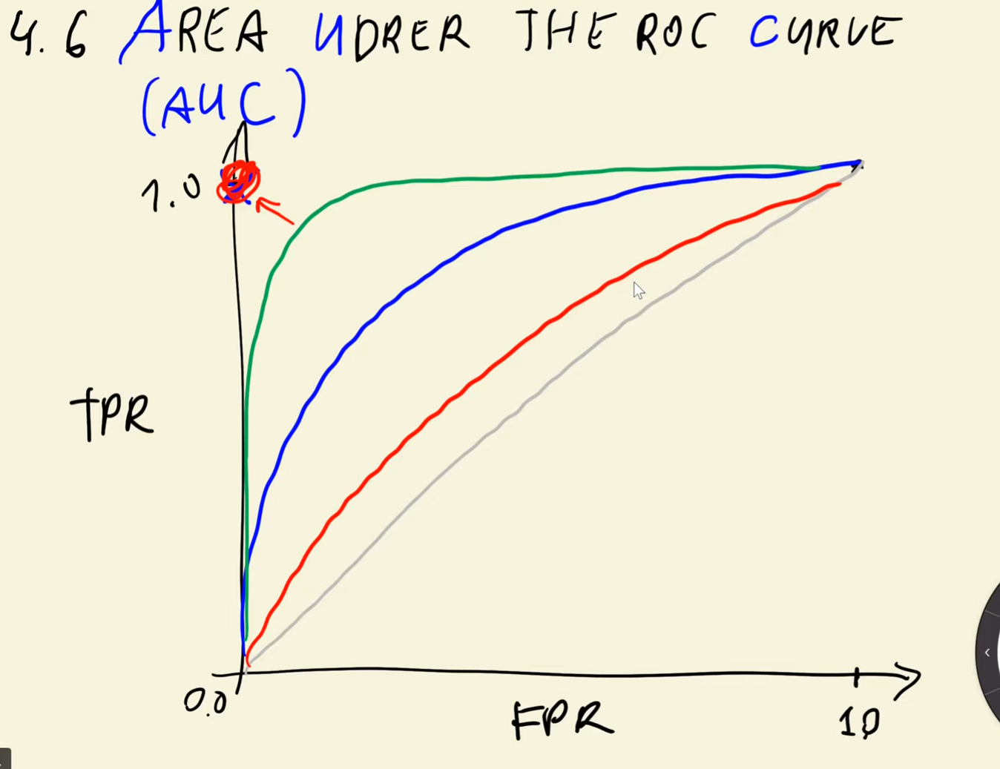

And one of the way to quantify how close we are to this "ideal point" is to measure the area under the curve

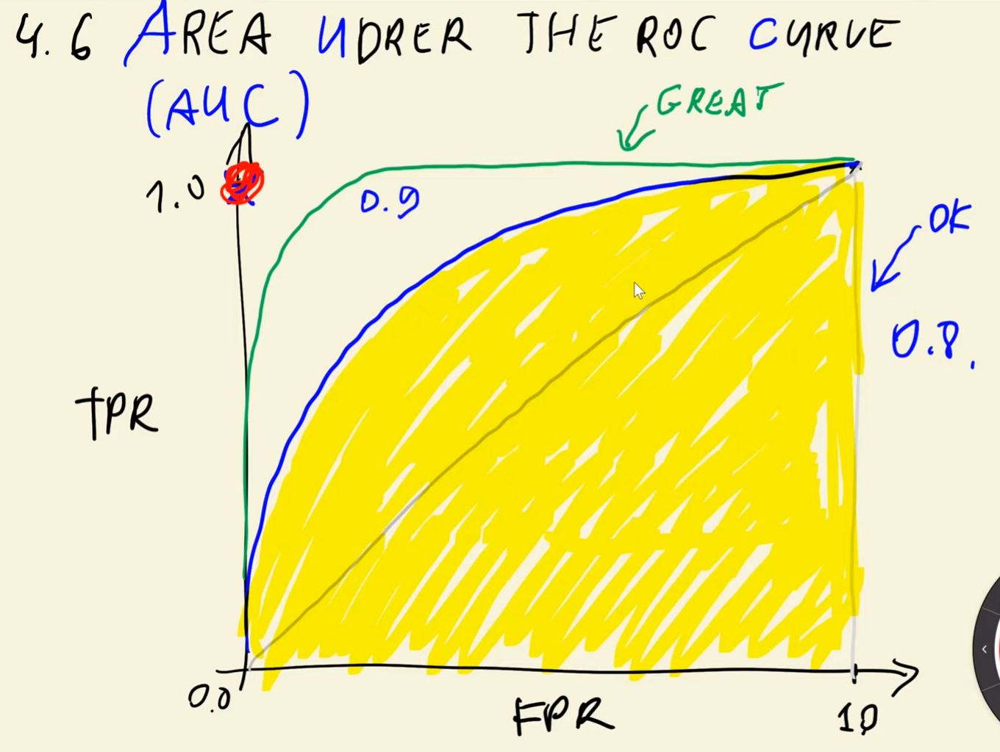

There're several baselines

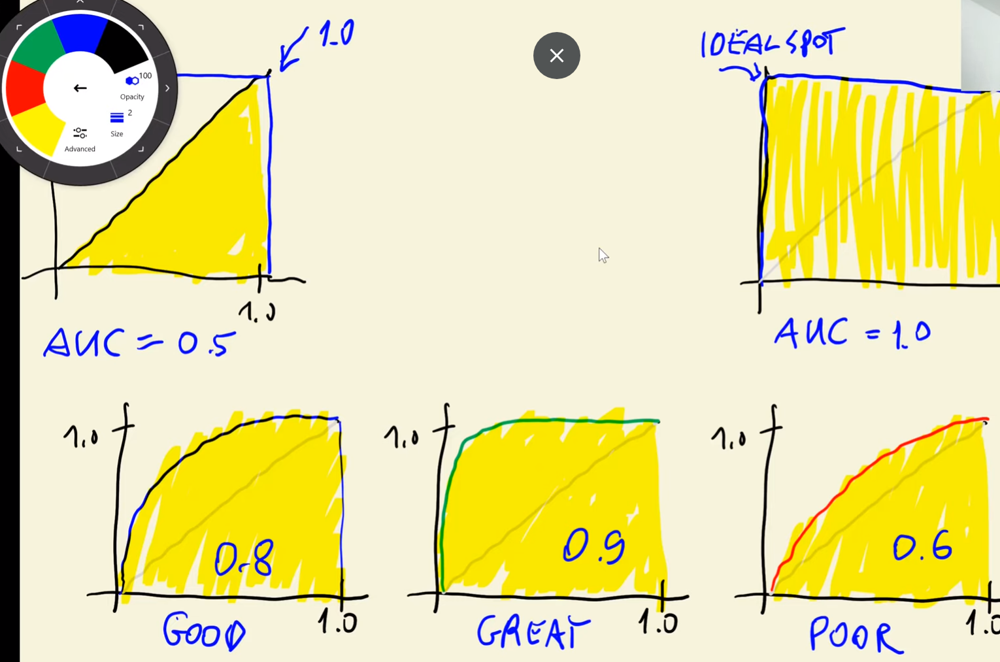

We can do this with scikit-learn

In [86]:
from sklearn.metrics import auc

In [87]:
auc(fpr, tpr)

0.843850505725819

So we get our auc. Actually we can do it even shorter

In [88]:
from sklearn.metrics import roc_auc_score

In [89]:
roc_auc_score(y_val, y_pred)

0.843850505725819

AUC Interpretation

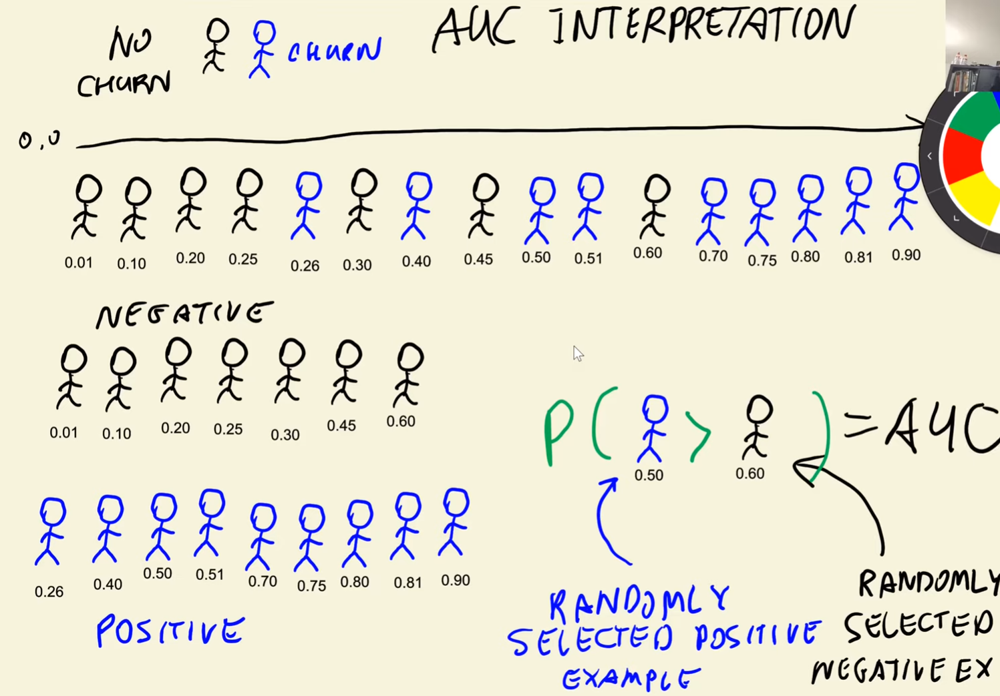

So AUC - is probabillity that randomly selected positive example has higher score than randomly selected negative example

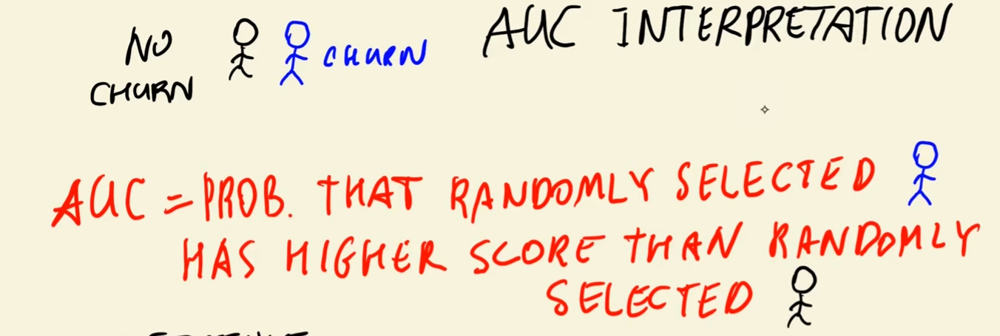

Let's program it

In [90]:
neg = y_pred[y_val == 0]
pos = y_pred[y_val == 1]

In [91]:
import random

In [96]:
n = 100000
success = 0


for i in range(n):
    positive_index = random.randint(0, len(pos) - 1)
    negative_index = random.randint(0, len(neg) - 1)
    
    if pos[positive_index] > neg[negative_index]:
        success = success + 1
        
        
success / n 

0.844

Let's implement this in numpy

In [97]:
n = 10000

pos_indx = np.random.randint(0, len(pos), size=n)
neg_indx = np.random.randint(0, len(neg), size=n) 

In [98]:
pos_indx

array([261, 200,   9, ..., 210, 232, 186])

In [99]:
pos[pos_indx]

array([0.18520639, 0.52373058, 0.6650978 , ..., 0.74820415, 0.37247333,
       0.59224406])

In [100]:
pos[pos_indx] > neg[neg_indx]

array([False,  True,  True, ...,  True,  True,  True])

In [101]:
n = 50000


(pos[pos_indx] > neg[neg_indx]).mean()

0.8352

## 4.7 Cross-Validation

- Evaluating the same model on different subsets of data
- Getting the average prediction and the spread within predictions

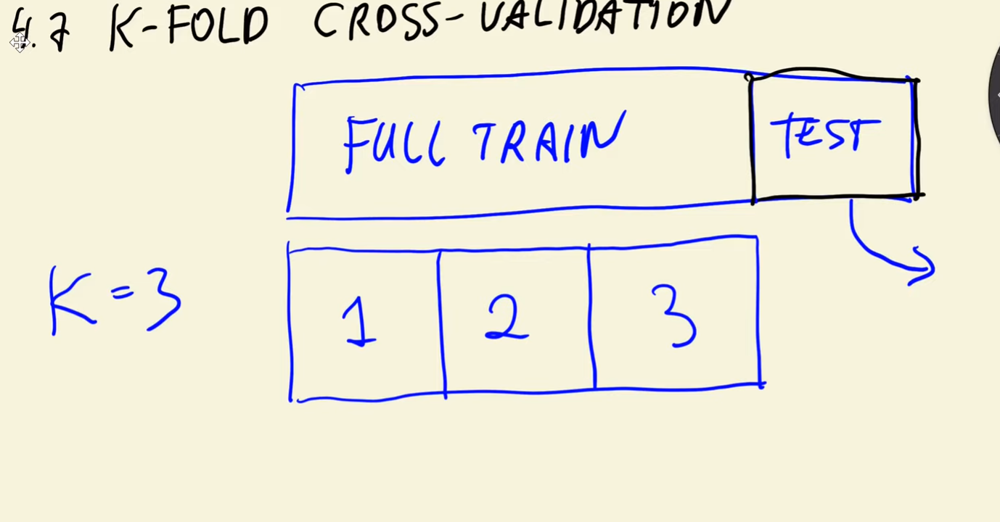

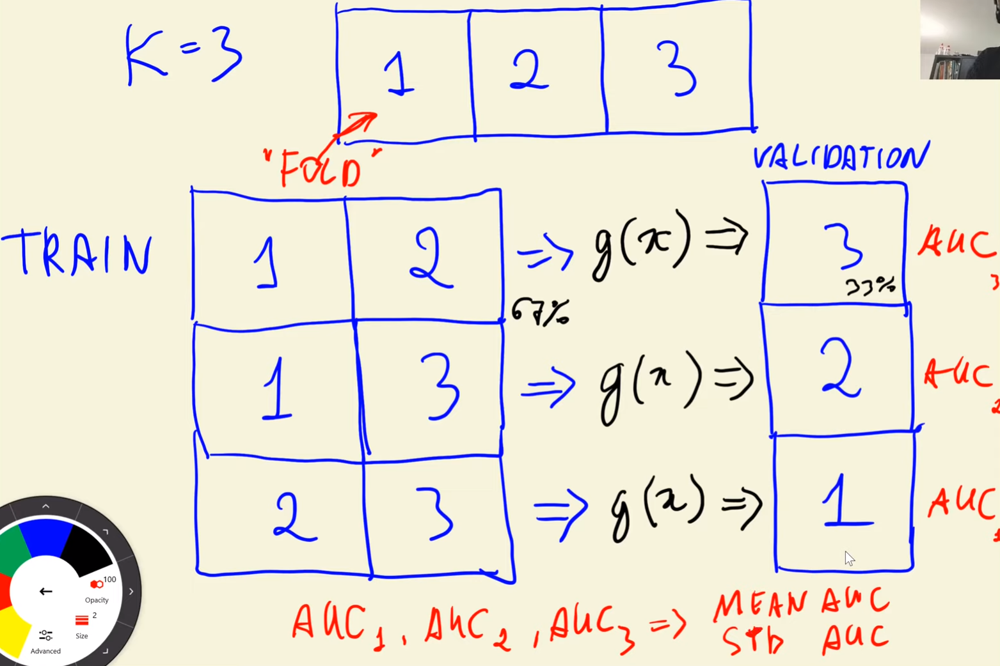

In [129]:
def train(df_train, y_train, C=1.0):
    dicts = df_train[categorical + numerical].to_dict(orient='records')
    
    dv = DictVectorizer(sparse=False)
    X_train = dv.fit_transform(dicts)
    
    model = LogisticRegression(C=C, max_iter=1000)
    model.fit(X_train, y_train)
    
    
    return dv, model

In [130]:
dv, model = train(df_train, y_train, C=0.001)

In [108]:
def predict(df, dv, model): 
    dicts = df[categorical + numerical].to_dict(orient='records')
    
    
    X = dv.transform(dicts)
    y_pred = model.predict_proba(X)[:, 1]
    
    return y_pred
    

In [109]:
y_pred = predict(df_val, dv, model)

Cross validation

In [111]:
from sklearn.model_selection import KFold

In [113]:
kfold = KFold(n_splits=10, shuffle=True, random_state=1)

In [114]:
next(kfold.split(df_full_train))

(array([   0,    1,    2, ..., 5631, 5632, 5633]),
 array([   4,   21,   28,   33,   44,   58,   67,   72,   79,   81,   82,
          98,  101,  116,  119,  125,  126,  136,  141,  147,  161,  169,
         179,  192,  196,  200,  206,  214,  222,  231,  250,  255,  259,
         276,  280,  285,  301,  308,  313,  314,  325,  343,  354,  359,
         383,  386,  407,  420,  428,  433,  440,  447,  457,  473,  486,
         496,  501,  503,  507,  545,  554,  557,  566,  574,  580,  582,
         592,  605,  608,  623,  634,  636,  645,  662,  667,  684,  687,
         689,  729,  745,  758,  763,  778,  783,  792,  795,  808,  839,
         840,  847,  850,  858,  867,  870,  871,  881,  899,  906,  927,
         929,  931,  940,  943,  976,  984,  987,  988, 1005, 1016, 1028,
        1034, 1038, 1050, 1056, 1074, 1079, 1117, 1122, 1123, 1131, 1134,
        1139, 1144, 1155, 1159, 1163, 1169, 1179, 1198, 1206, 1216, 1238,
        1247, 1256, 1272, 1297, 1298, 1310, 1344, 1356, 1370,

In [116]:
train_idx, val_idx = next(kfold.split(df_full_train))

In [117]:
len(train_idx), len(val_idx)

(5070, 564)

In [118]:
len(df_full_train)

5634

In [119]:
df_train = df_full_train.iloc[train_idx]
df_val = df_full_train.iloc[val_idx]

In [123]:
from tqdm.auto import tqdm

In [135]:
n_splits = 5

for C in tqdm([0.001, 0.01, 0.1, 0.5, 1, 5, 10]):


    scores = []
    
    kfold = KFold(n_splits=n_splits, shuffle=True, random_state=1)

    for train_idx, val_idx in kfold.split(df_full_train):
        df_train = df_full_train.iloc[train_idx]
        df_val = df_full_train.iloc[val_idx]

        y_train = df_train.churn.values
        y_val = df_val.churn.values


        dv, model = train(df_train, y_train)
        y_pred = predict(df_val, dv, model)

        auc = roc_auc_score(y_val, y_pred)
        scores.append(auc)
        
    print('C=%s %.3f +- %.3f' % (C, np.mean(scores), np.std(scores)))

  0%|          | 0/7 [00:00<?, ?it/s]

C=0.001 0.841 +- 0.008
C=0.01 0.841 +- 0.008
C=0.1 0.841 +- 0.008
C=0.5 0.841 +- 0.008
C=1 0.841 +- 0.008
C=5 0.841 +- 0.008
C=10 0.841 +- 0.008


In [127]:
scores

[0.8479398247539081,
 0.8411200495049505,
 0.8557048652060528,
 0.8340630400790059,
 0.8245347394540943,
 0.8342657342657342,
 0.8412569195701727,
 0.8186669829222013,
 0.8455313472654512,
 0.8628785587039091]

In the end we have to train our model on full_train_dataset and evaluate on test_dataset

In [137]:
dv, model = train(df_full_train, df_full_train.churn.values, C=1)

y_pred = predict(df_test, dv, model)

auc = roc_auc_score(y_test, y_pred)
auc

0.8572386167896259

We get a little bit better auc

## 4.8 Summary

- Metric - a single number that describes the performance of a model 
- Accuracy - fraction of correct answers; sometimes misleading 
- Precision and recall are less misleading when we have calss inbalance 
- ROC Curve - a way to evaluate the performance at all thresholds; okay to use with imbalance 
- K-Fold CV - more reliable estimate for performance (mean + std)

## 4.9 Explore more

- Check the precision and recall of the dummy classifier that always predict "FALSE"
- F1 score = 2 * P * R / (P + R)
- Evaluate precision and recall at different thresholds, plot P vs R - this way you'll get the precision/recall curve (similar to ROC curve)
- Area under the PR curve is also a useful metric 

Other projects: 
- Calculate the metrics for datasets from the previous week